In [1]:
#Importing all required library
import nltk
import re
import string
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import word_tokenize, sent_tokenize
from wordcloud import WordCloud, STOPWORDS

In [2]:
#Downloading nltk StopWords and Wordnet 
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tanuj\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\tanuj\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

# Dataset1
1.importing 1st dataset
2.EDA on 1st dataset
3.Data pre-processing

In [3]:
Dataset1 = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\data.csv")

In [4]:
Dataset1.head()

,URLs,Headline,Body,Label
0,http://www.bbc.com/news/world-us-canada-414191...,Four ways Bob Corker skewered Donald Trump,Image copyright Getty Images\nOn Sunday mornin...,1
1,https://www.reuters.com/article/us-filmfestiva...,Linklater's war veteran comedy speaks to moder...,"LONDON (Reuters) - “Last Flag Flying”, a comed...",1
2,https://www.nytimes.com/2017/10/09/us/politics...,Trump’s Fight With Corker Jeopardizes His Legi...,The feud broke into public view last week when...,1
3,https://www.reuters.com/article/us-mexico-oil-...,Egypt's Cheiron wins tie-up with Pemex for Mex...,MEXICO CITY (Reuters) - Egypt’s Cheiron Holdin...,1
4,http://www.cnn.com/videos/cnnmoney/2017/10/08/...,Jason Aldean opens 'SNL' with Vegas tribute,"Country singer Jason Aldean, who was performin...",1


In [5]:
Dataset1.tail()

,URLs,Headline,Body,Label
4004,http://beforeitsnews.com/sports/2017/09/trends...,Trends to Watch,Trends to Watch\n% of readers think this story...,0
4005,http://beforeitsnews.com/u-s-politics/2017/10/...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,0
4006,https://www.activistpost.com/2017/09/ron-paul-...,"Ron Paul on Trump, Anarchism & the AltRight",NaN,0
4007,https://www.reuters.com/article/us-china-pharm...,China to accept overseas trial data in bid to ...,SHANGHAI (Reuters) - China said it plans to ac...,1
4008,http://beforeitsnews.com/u-s-politics/2017/10/...,Vice President Mike Pence Leaves NFL Game Beca...,Vice President Mike Pence Leaves NFL Game Beca...,0


In [6]:
Dataset1.nunique()

URLs        3254
Headline    2831
Body        2863
Label          2
dtype: int64

In [7]:
import pandas as pd

# Load the dataset
Dataset1 = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\data.csv")

# Fix column names to match dataset
Dataset1["Article"] = Dataset1["Headline"] + " " + Dataset1["Body"]

# Shuffle the dataset
Dataset1 = Dataset1.sample(frac=1, random_state=42).reset_index(drop=True)

# Convert labels
Dataset1["Label"] = Dataset1["Label"].map({1: 1, 0: 0})  # Assuming 1=REAL, 0=FAKE

# Keep only required columns & drop missing values
Dataset1 = Dataset1[["Article", "Label"]].dropna()

# Show the first few rows
print(Dataset1.head())



                                             Article  Label
0  Mediaset and Vivendi in contact over pay-TV di...      1
1  Nobel prize: Chronicle of wound-up 'Harukists'...      1
2  The week in 35 photos US Secretary of State Re...      1
3  Florida State’s season is in a heap of trouble...      0
4  America Needs a New News Source America Needs ...      0


In this step we will clean the data that will be used for training. The cleaning will involve these steps-
1.Removing all the extra information like brackets, any kind of puctuations - commas, apostrophes, quotes, question marks, and more.
2.Remove all the numeric text, urls

In [8]:
def wordpre(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    
    return text

<>:3: SyntaxWarning: invalid escape sequence '\['
<>:5: SyntaxWarning: invalid escape sequence '\S'
<>:9: SyntaxWarning: invalid escape sequence '\w'
<>:3: SyntaxWarning: invalid escape sequence '\['
<>:5: SyntaxWarning: invalid escape sequence '\S'
<>:9: SyntaxWarning: invalid escape sequence '\w'
C:\Users\tanuj\AppData\Local\Temp\ipykernel_16084\606700188.py:3: SyntaxWarning: invalid escape sequence '\['
  text = re.sub('\[.*?\]', '', text)
C:\Users\tanuj\AppData\Local\Temp\ipykernel_16084\606700188.py:5: SyntaxWarning: invalid escape sequence '\S'
  text = re.sub('https?://\S+|www\.\S+', '', text)
C:\Users\tanuj\AppData\Local\Temp\ipykernel_16084\606700188.py:9: SyntaxWarning: invalid escape sequence '\w'
  text = re.sub('\w*\d\w*', '', text)


In [9]:
##  Applying the wordpre method to the dataset
Dataset1['Article']=Dataset1['Article'].apply(wordpre)

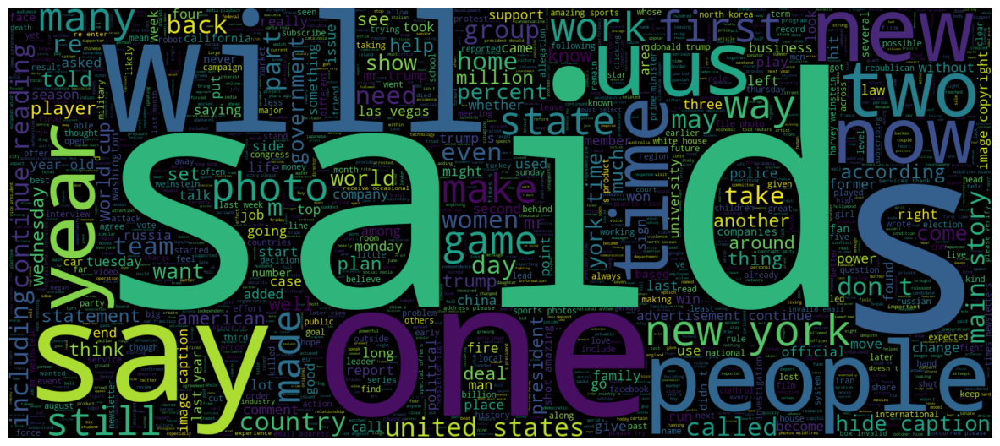

In [10]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Create word cloud for real news
plt.figure(figsize=(15, 15))
wc = WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate(
    " ".join(Dataset1[Dataset1["Label"] == 1]["Article"])
)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")  # Hide axes
plt.show()


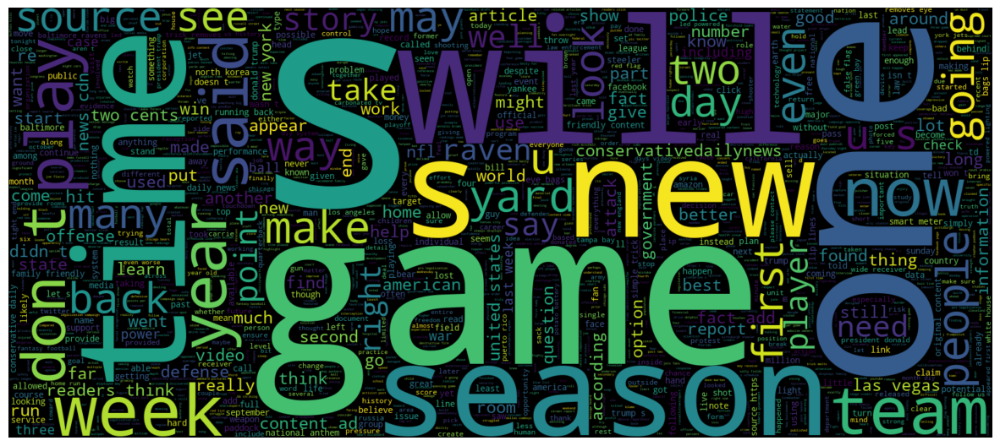

In [11]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Create word cloud for fake news
plt.figure(figsize=(15, 15))
wc = WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate(
    " ".join(Dataset1[Dataset1["Label"] == 0]["Article"])  # Use "Label" instead of "label"
)
plt.imshow(wc, interpolation="bilinear")
plt.axis("off")  # Hide axes
plt.show()


# Dataset2

In [12]:
Dataset2_true = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\Dataset\True.csv")
Dataset2_fake = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\Dataset\Fake.csv")

In [13]:
Dataset2_true.nunique()

title      20826
text       21192
subject        2
date         716
dtype: int64

In [14]:
Dataset2_fake.nunique()

title      17903
text       17455
subject        6
date        1681
dtype: int64

In [15]:
# Counting subjects in Real news
for key, count in Dataset2_true["subject"].value_counts().items():  # Use `.items()` instead of `.iteritems()`
    print(f"{key}:\t{count}")

# Getting Total Rows
print(f"Total Records:\t{Dataset2_true.shape[0]}")


politicsNews:	11272
worldnews:	10145
Total Records:	21417


In [16]:
# Counting subjects in Fake news
for key, count in Dataset2_fake["subject"].value_counts().items():  # Use `.items()` instead of `.iteritems()`
    print(f"{key}:\t{count}")

# Getting Total Rows
print(f"Total Records:\t{Dataset2_fake.shape[0]}")


News:	9050
politics:	6841
left-news:	4459
Government News:	1570
US_News:	783
Middle-east:	778
Total Records:	23481


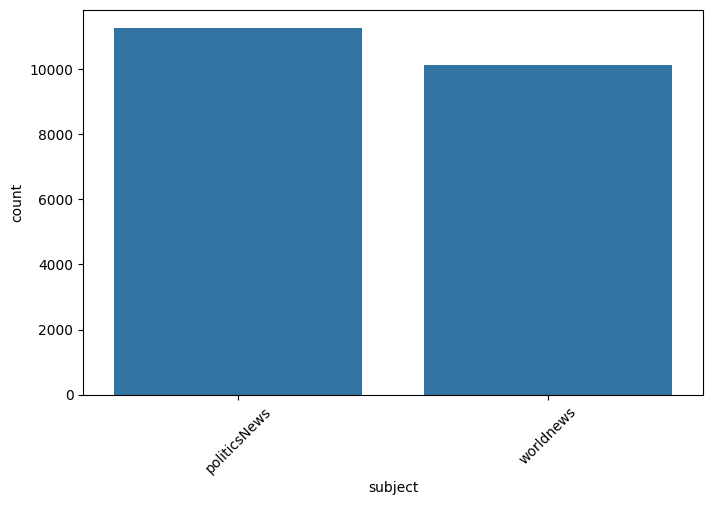

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the subjects in Real news
plt.figure(figsize=(8, 5))
sns.countplot(x="subject", data=Dataset2_true)  # Use x="subject" instead of passing it as a positional argument
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


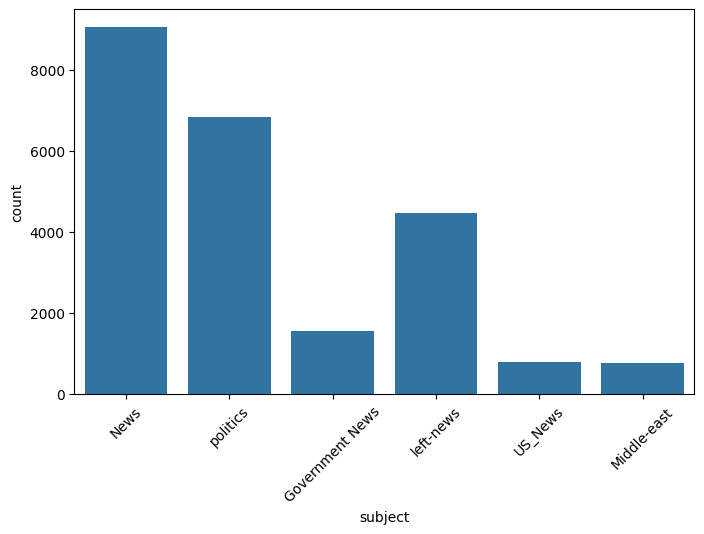

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the subjects in Fake news
plt.figure(figsize=(8, 5))
sns.countplot(x="subject", data=Dataset2_fake)  # Explicitly specify x-axis
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


In [19]:
Dataset2_true['label']= 1
Dataset2_fake['label']= 0
Dataset2 = pd.concat([Dataset2_true, Dataset2_fake])
Dataset2["Article"] = Dataset2["title"] + Dataset2["text"]
Dataset2.sample(frac = 1) #Shuffle 100%
Dataset2 = Dataset2.loc[:,['Article','label']]

In [20]:
Dataset2

,Article,label
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1
...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,0
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,0
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,0
23479,How to Blow $700 Million: Al Jazeera America F...,0


In [21]:
##  Applying the wordpre method to the dataset
Dataset2['Article']=Dataset2['Article'].apply(wordpre)

In [22]:
Dataset2.head()

,Article,label
0,as u s budget fight looms republicans flip t...,1
1,u s military to accept transgender recruits o...,1
2,senior u s republican senator let mr muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much mor...,1


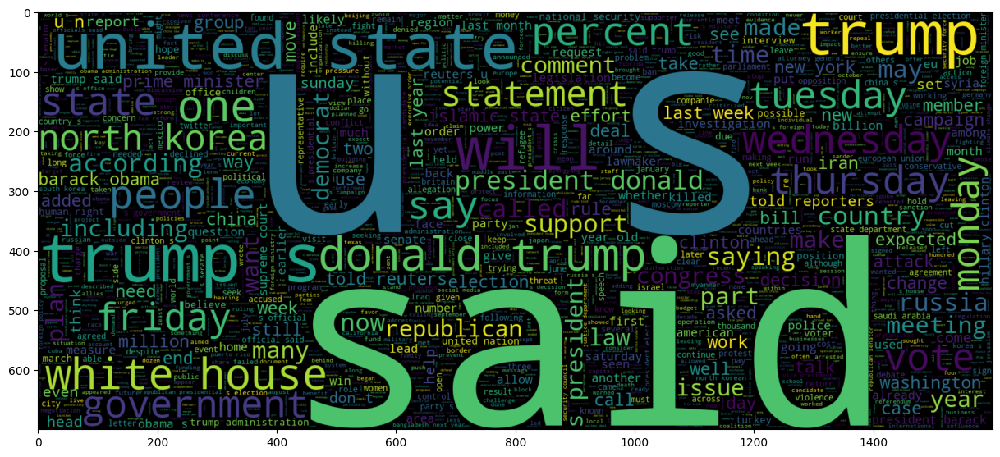

In [23]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

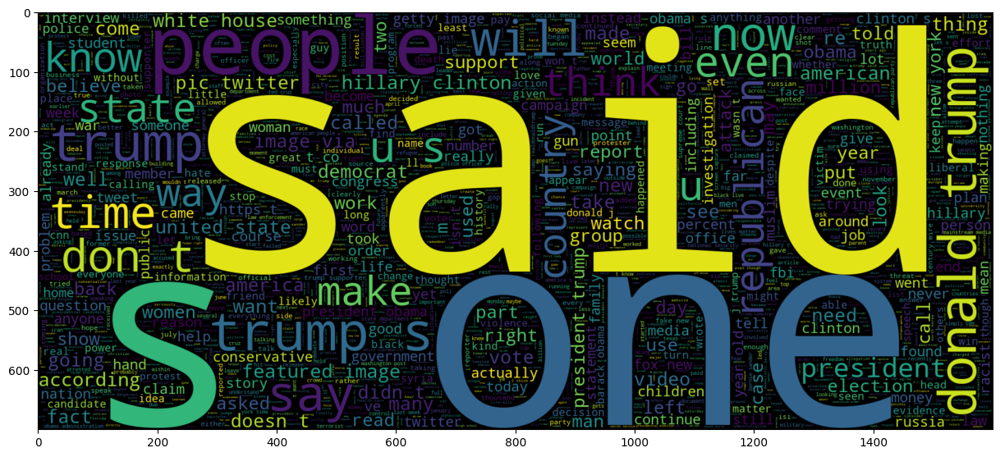

In [24]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 3

In [25]:
Dataset3_real = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\politifact\politifact_real.csv")
Dataset3_fake = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\politifact\politifact_fake.csv")

In [26]:
import pandas as pd

# Define file paths (Update these if needed)
fake_news_path = (r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\politifact\politifact_fake.csv")
real_news_path = (r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\politifact\politifact_real.csv")

# Load datasets
df_fake = pd.read_csv(fake_news_path)
df_real = pd.read_csv(real_news_path)

# Display first few rows to check structure
print("Fake News Dataset:")
print(df_fake.head())

print("\nReal News Dataset:")
print(df_real.head())



Fake News Dataset:
                id                                           news_url  \
0  politifact15014          speedtalk.com/forum/viewtopic.php?t=51650   
1  politifact15156  politics2020.info/index.php/2018/03/13/court-o...   
2  politifact14745  www.nscdscamps.org/blog/category/parenting/467...   
3  politifact14355  https://howafrica.com/oscar-pistorius-attempts...   
4  politifact15371  http://washingtonsources.org/trump-votes-for-d...   

                                               title  \
0  BREAKING: First NFL Team Declares Bankruptcy O...   
1  Court Orders Obama To Pay $400 Million In Rest...   
2  UPDATE: Second Roy Moore Accuser Works For Mic...   
3         Oscar Pistorius Attempts To Commit Suicide   
4        Trump Votes For Death Penalty For Being Gay   

                                           tweet_ids  
0  937349434668498944\t937379378006282240\t937380...  
1  972666281441878016\t972678396575559680\t972827...  
2  929405740732870656\t92943945040026419

In [27]:
import pandas as pd

# Reload datasets
fake_news_path = (r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\politifact\politifact_fake.csv")
real_news_path = (r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\politifact\politifact_real.csv")

df_fake = pd.read_csv(fake_news_path)
df_real = pd.read_csv(real_news_path)

# Add labels: 0 for Fake, 1 for Real
df_fake["label"] = 0
df_real["label"] = 1

# Merge both datasets
Dataset3 = pd.concat([df_fake, df_real], ignore_index=True)

# Ensure 'Article' column exists (Use 'title' or 'text' if necessary)
if "title" in Dataset3.columns:
    Dataset3["Article"] = Dataset3["title"]
elif "text" in Dataset3.columns:
    Dataset3["Article"] = Dataset3["text"]
else:
    raise ValueError("Dataset does not contain 'title' or 'text' column.")

print(Dataset3.head())  # Check the dataset


                id                                           news_url  \
0  politifact15014          speedtalk.com/forum/viewtopic.php?t=51650   
1  politifact15156  politics2020.info/index.php/2018/03/13/court-o...   
2  politifact14745  www.nscdscamps.org/blog/category/parenting/467...   
3  politifact14355  https://howafrica.com/oscar-pistorius-attempts...   
4  politifact15371  http://washingtonsources.org/trump-votes-for-d...   

                                               title  \
0  BREAKING: First NFL Team Declares Bankruptcy O...   
1  Court Orders Obama To Pay $400 Million In Rest...   
2  UPDATE: Second Roy Moore Accuser Works For Mic...   
3         Oscar Pistorius Attempts To Commit Suicide   
4        Trump Votes For Death Penalty For Being Gay   

                                           tweet_ids  label  \
0  937349434668498944\t937379378006282240\t937380...      0   
1  972666281441878016\t972678396575559680\t972827...      0   
2  929405740732870656\t929439450400

In [28]:
import re

def wordpre(text):
    """Basic text preprocessing: lowercase, remove special characters, etc."""
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'\W+', ' ', text)  # Remove non-word characters
    return text

# Apply wordpre function to 'Article' column
Dataset3["Article"] = Dataset3["Article"].apply(wordpre)

# Display processed data
print(Dataset3.head())


                id                                           news_url  \
0  politifact15014          speedtalk.com/forum/viewtopic.php?t=51650   
1  politifact15156  politics2020.info/index.php/2018/03/13/court-o...   
2  politifact14745  www.nscdscamps.org/blog/category/parenting/467...   
3  politifact14355  https://howafrica.com/oscar-pistorius-attempts...   
4  politifact15371  http://washingtonsources.org/trump-votes-for-d...   

                                               title  \
0  BREAKING: First NFL Team Declares Bankruptcy O...   
1  Court Orders Obama To Pay $400 Million In Rest...   
2  UPDATE: Second Roy Moore Accuser Works For Mic...   
3         Oscar Pistorius Attempts To Commit Suicide   
4        Trump Votes For Death Penalty For Being Gay   

                                           tweet_ids  label  \
0  937349434668498944\t937379378006282240\t937380...      0   
1  972666281441878016\t972678396575559680\t972827...      0   
2  929405740732870656\t929439450400

In [29]:
##  Applying the wordpre method to the dataset
Dataset3['Article']=Dataset3['Article'].apply(wordpre)

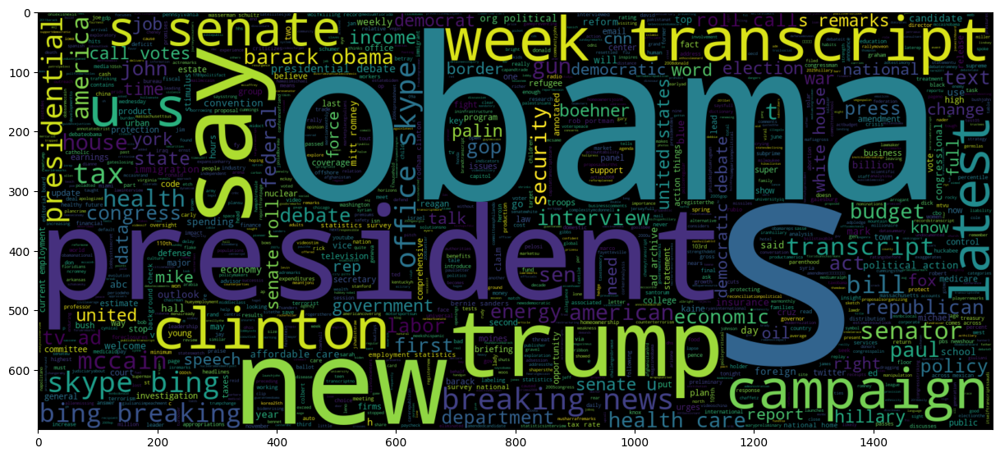

In [30]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

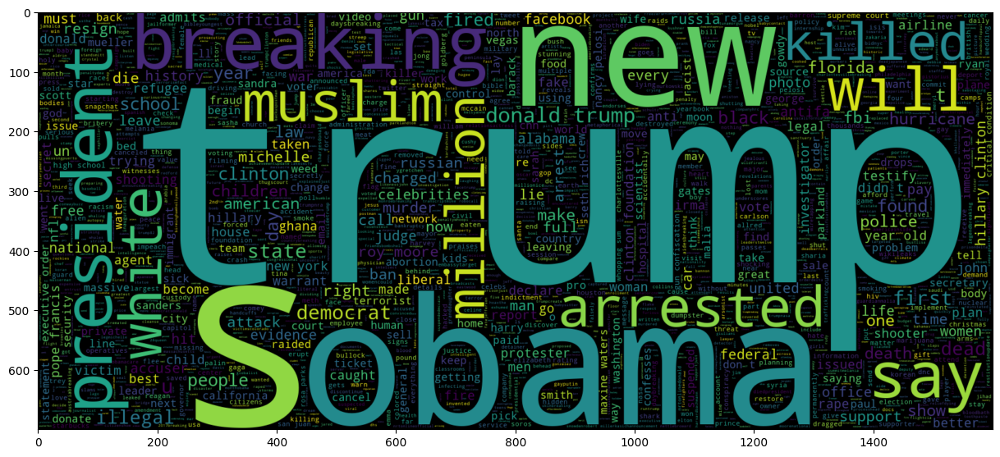

In [31]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 4

In [32]:
Dataset4 = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\Data-set\train.csv")

In [33]:
Dataset4.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [34]:
Dataset4["Article"] = Dataset4["title"] + Dataset4["text"]
Dataset4.sample(frac = 1) #Shuffle 100%

Dataset4 = Dataset4.loc[:,['Article','label']]
Dataset4 = Dataset4.dropna()

In [35]:
##  Applying the wordpre method to the dataset
Dataset4['Article']=Dataset4['Article'].apply(wordpre)

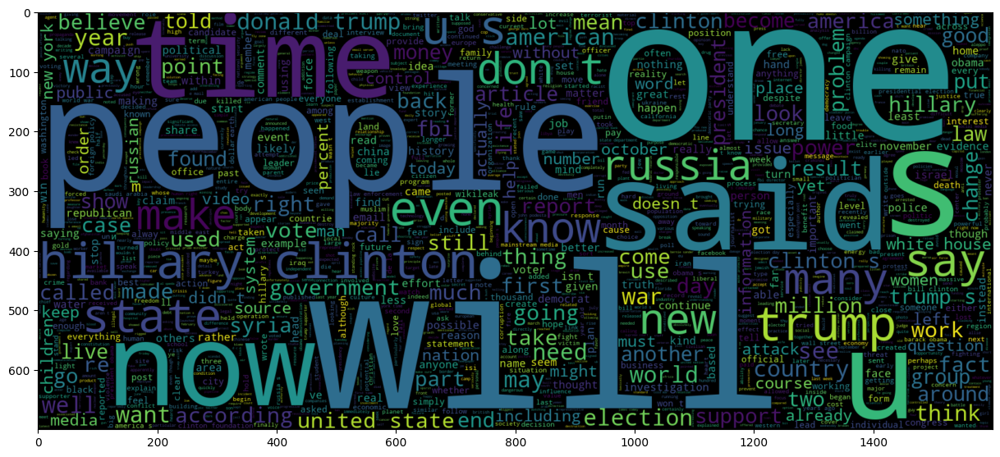

In [36]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

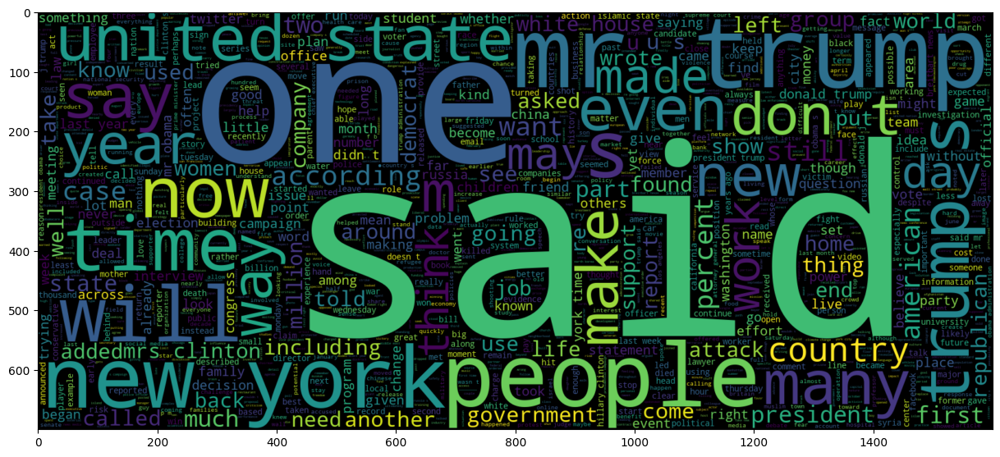

In [37]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 5

In [38]:
Dataset5 = pd.read_csv(r"C:\Users\tanuj\OneDrive\Desktop\Fake_news_Detection-main\Fake_news_Detection-main\data.csv")

In [39]:
Dataset5

,URLs,Headline,Body,Label
0,http://www.bbc.com/news/world-us-canada-414191...,Four ways Bob Corker skewered Donald Trump,Image copyright Getty Images\nOn Sunday mornin...,1
1,https://www.reuters.com/article/us-filmfestiva...,Linklater's war veteran comedy speaks to moder...,"LONDON (Reuters) - “Last Flag Flying”, a comed...",1
2,https://www.nytimes.com/2017/10/09/us/politics...,Trump’s Fight With Corker Jeopardizes His Legi...,The feud broke into public view last week when...,1
3,https://www.reuters.com/article/us-mexico-oil-...,Egypt's Cheiron wins tie-up with Pemex for Mex...,MEXICO CITY (Reuters) - Egypt’s Cheiron Holdin...,1
4,http://www.cnn.com/videos/cnnmoney/2017/10/08/...,Jason Aldean opens 'SNL' with Vegas tribute,"Country singer Jason Aldean, who was performin...",1
...,...,...,...,...
4004,http://beforeitsnews.com/sports/2017/09/trends...,Trends to Watch,Trends to Watch\n% of readers think this story...,0
4005,http://beforeitsnews.com/u-s-politics/2017/10/...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,0
4006,https://www.activistpost.com/2017/09/ron-paul-...,"Ron Paul on Trump, Anarchism & the AltRight",NaN,0
4007,https://www.reuters.com/article/us-china-pharm...,China to accept overseas trial data in bid to ...,SHANGHAI (Reuters) - China said it plans to ac...,1


In [40]:
Dataset5["Article"] = Dataset5["Headline"] + Dataset5["Body"]
Dataset5["label"] = Dataset5["Label"]
Dataset5.sample(frac = 1) #Shuffle 100%
Dataset5 = Dataset5.loc[:,['Article','label']]
Dataset5 = Dataset5.dropna()

In [41]:
##  Applying the wordpre method to the dataset
Dataset5['Article']=Dataset5['Article'].apply(wordpre)

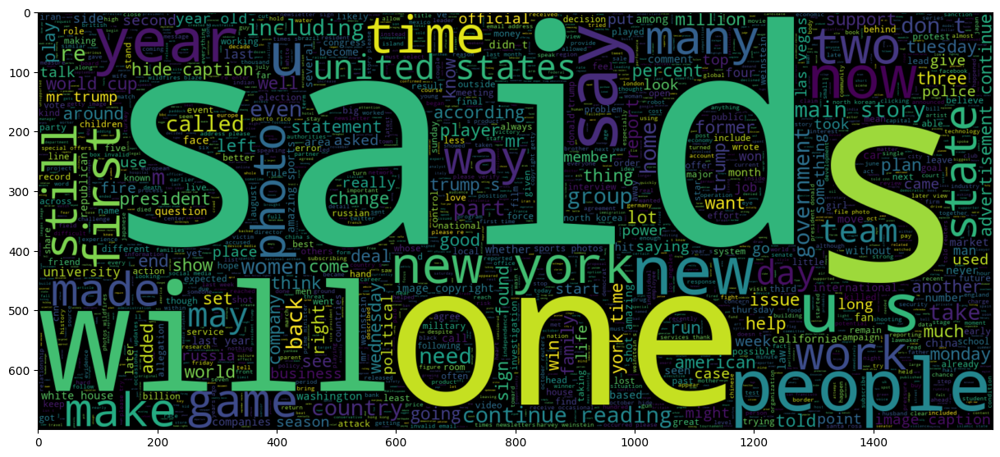

In [42]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

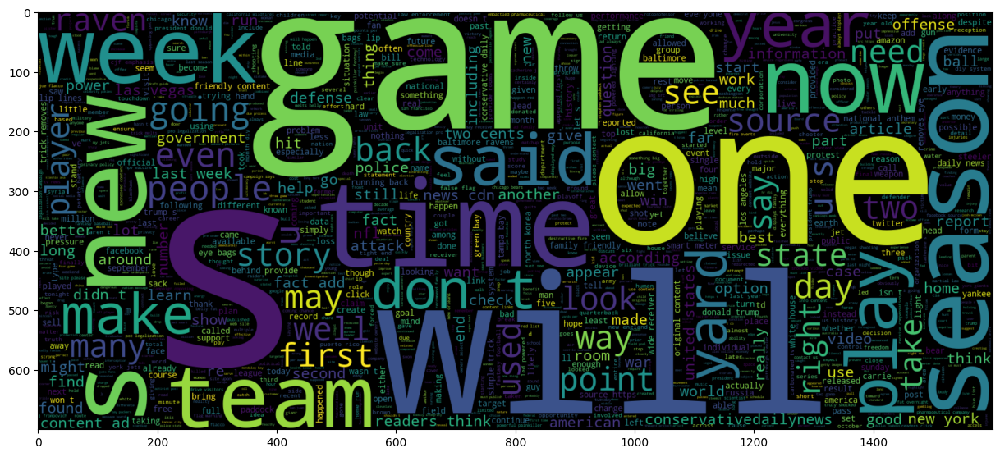

In [43]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

In [44]:
#combining all the datset into one
frames = [Dataset1, Dataset2, Dataset3, Dataset4,Dataset5]
Dataset = pd.concat(frames)

In [45]:
Dataset.shape

(74133, 7)

In [46]:
x_train,x_test,y_train,y_test = train_test_split(Dataset['Article'], Dataset['label'], test_size=0.2, random_state=2020)

In [47]:


print(x_train.shape)  # Now this should work


(59306,)


In [48]:

print(x_test.shape)        # Now shape should work


(14827,)


In [49]:
print(type(y_train))
print(type(y_test))


<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>


In [50]:
import pandas as pd
y_train = pd.Series(y_train)
y_test = pd.Series(y_test)


In [51]:
print("Missing values in y_train:", y_train.isna().sum())
print("Missing values in y_test:", y_test.isna().sum())


Missing values in y_train: 3190
Missing values in y_test: 798


In [52]:
y_train = y_train.fillna(0)
y_test = y_test.fillna(0)


In [53]:
y_train = y_train.dropna()
y_test = y_test.dropna()


In [54]:
y_train = y_train.astype(int)
y_test = y_test.astype(int)


In [55]:
print("Conversion successful!")
print(y_train.head())
print(y_test.head())


Conversion successful!
22119    0
20176    0
1053     1
18352    1
17371    1
Name: label, dtype: int64
5347     0
16182    1
3113     1
11079    1
1228     0
Name: label, dtype: int64


In [56]:
import numpy as np

# Check for NaN values in y_train and y_test
print("Missing values in y_train:", y_train.isna().sum())
print("Missing values in y_test:", y_test.isna().sum())

# Option 1: Fill NaN values with 0 (or another default value)
y_train = y_train.fillna(0)
y_test = y_test.fillna(0)

# Option 2: Drop NaN values (if necessary)
# y_train = y_train.dropna()
# y_test = y_test.dropna()

# Convert to integers
y_train = y_train.astype(int)
y_test = y_test.astype(int)

print("Conversion successful!")


Missing values in y_train: 0
Missing values in y_test: 0
Conversion successful!


In [57]:
#LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

pipe = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('model', LogisticRegression())
])

# Train the model
Logisticmodel = pipe.fit(x_train, y_train)

# Make predictions
prediction = Logisticmodel.predict(x_test)

# Calculate accuracy
accuracy = round(accuracy_score(y_test, prediction) * 100, 2)
print(f"Accuracy: {accuracy}%")



Accuracy: 91.01%


In [58]:
#####DecisionTreeClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = 10, 
                                           splitter='best', 
                                           random_state=2020))])
DecisionTreemodel = pipe.fit(x_train, y_train)
prediction = DecisionTreemodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
DecisionTreemodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 89.63%


In [59]:
#####RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Define the pipeline with optimized parameters
pipe = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('model', RandomForestClassifier(n_estimators=50, max_depth=10, n_jobs=-1, random_state=42))  # Optimized
])

# Train the model
RandomForestmodel = pipe.fit(x_train, y_train)

# Make predictions
prediction = RandomForestmodel.predict(x_test)

# Calculate accuracy
accuracy = round(accuracy_score(y_test, prediction) * 100, 2)
print(f"Accuracy: {accuracy}%")

# Store accuracy
RandomForestmodel_accuracy = accuracy


Accuracy: 81.33%


In [60]:

#Stochastic Gradient Descent
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', SGDClassifier())])
SGDmodel = pipe.fit(x_train, y_train)
prediction = SGDmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
SDGmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)


accuracy: 90.36%


In [61]:
#GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

# Define the pipeline
pipe = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('model', GradientBoostingClassifier(
        loss='log_loss',  # Fixed: 'deviance' → 'log_loss'
        learning_rate=0.01,
        n_estimators=10,
        max_depth=5,
        random_state=55
    ))
])

# Train the model
GBCmodel = pipe.fit(x_train, y_train)

# Make predictions
prediction = GBCmodel.predict(x_test)

# Calculate accuracy
accuracy = round(accuracy_score(y_test, prediction) * 100, 2)
print(f"Accuracy: {accuracy}%")

# Store accuracy
GBCmodel_accuracy = accuracy


Accuracy: 87.31%


In [62]:
#########XGBClassifier
from xgboost import XGBClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', XGBClassifier(loss = 'deviance',
                                                   learning_rate = 0.01,
                                                   n_estimators = 10,
                                                   max_depth = 5,
                                                   random_state=2020))])

xgboostmodel = pipe.fit(x_train, y_train)
prediction = xgboostmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
xgboostmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

c:\Users\tanuj\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\core.py:158: UserWarning: [05:24:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "loss" } are not used.

  warnings.warn(smsg, UserWarning)


accuracy: 87.36%


In [63]:
#######Multinomial Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', MultinomialNB())])

MNBCmodel = pipe.fit(x_train, y_train)
prediction = MNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Multinomial_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 79.88%


In [64]:
#############Bernoulli Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', BernoulliNB())])

BNBCmodel = pipe.fit(x_train, y_train)
prediction = BNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Bernoulli_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 77.26%


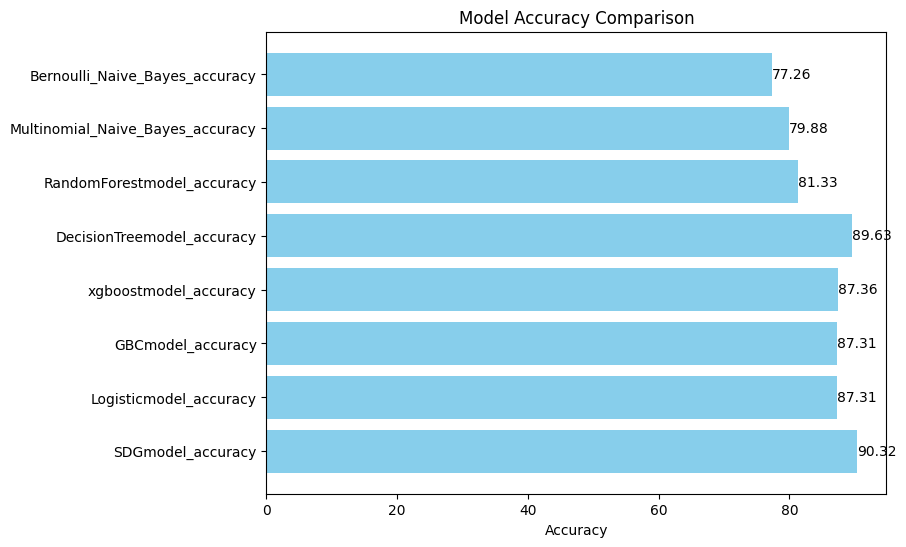

In [65]:
import matplotlib.pyplot as plt

# Example accuracy values — replace these with your actual model accuracies
SDGmodel_accuracy = 90.32
Logisticmodel_accuracy = 87.31
GBCmodel_accuracy = 87.31
xgboostmodel_accuracy = 87.36
DecisionTreemodel_accuracy = 89.63
RandomForestmodel_accuracy = 81.33
Multinomial_Naive_Bayes_accuracy = 79.88
Bernoulli_Naive_Bayes_accuracy = 77.26

x = ["SDGmodel_accuracy", "Logisticmodel_accuracy", "GBCmodel_accuracy", "xgboostmodel_accuracy", 
     "DecisionTreemodel_accuracy", "RandomForestmodel_accuracy", "Multinomial_Naive_Bayes_accuracy",
     "Bernoulli_Naive_Bayes_accuracy"]

y = [SDGmodel_accuracy, Logisticmodel_accuracy, GBCmodel_accuracy, xgboostmodel_accuracy,
     DecisionTreemodel_accuracy, RandomForestmodel_accuracy, Multinomial_Naive_Bayes_accuracy,
     Bernoulli_Naive_Bayes_accuracy]

plt.figure(figsize=(8, 6))
plt.barh(x, y, color='skyblue')

# Adding text labels to the bars
for index, value in enumerate(y):
    plt.text(value, index, f"{value:.2f}", va='center')

plt.xlabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.show()


In [66]:
import joblib  
# Save the model as a pickle in a file 
joblib.dump(Logisticmodel, 'model.pkl') 

['model.pkl']